<center>
<p><img src="https://mcd.unison.mx/wp-content/themes/awaken/img/logo_mcd.png" width="150">
</p>



<h1>MAESTRÍA EN CIENCIA DE DATOS</h1>

<h3>Proyecto final de Álgebra lineal  </h3>
<h3>  Indice de marginación municipal en México, 2020 </h3>
</center>

<p> Por: </p>
<p> Daniel Eduardo Vázquez Espinoza </p>

<p> Profesora </p>
<p> Dr. Olivia Gutú </p>



# Cargar librerias
Primero cargaremos todas las librerias que utilizaremos a lo largo del documento.

In [150]:
pip install --upgrade xlrd

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [236]:
%config IPCompleter.greedy=True
import pandas as pd
import numpy as np
import xlrd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
from numpy.linalg import matrix_rank
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression


# 1. Extraer y analizar la Base de datos.

Descarga el archivo adjunto `MARGINACION_AGEBS_2020.xls`
 y crea un dataframe de nombre `df_INDICE`.

In [152]:
from google.colab import files

In [153]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [154]:
df_indice=pd.read_excel("/content/drive/MyDrive/MARGINACION_AGEBS_2020.xls")
print("Las dimensiones de la base de datos son",df_indice.shape,".")
print("vista rapida del data frame")
print(df_indice.head())

Las dimensiones de la base de datos son (50790, 23) .
vista rapida del data frame
        CVE_AGEB  ENT         NOM_ENT  MUN         NOM_MUN  LOC  \
0  0100100010017    1  Aguascalientes    1  Aguascalientes    1   
1  010010001006A    1  Aguascalientes    1  Aguascalientes    1   
2  0100100010106    1  Aguascalientes    1  Aguascalientes    1   
3  0100100010163    1  Aguascalientes    1  Aguascalientes    1   
4  0100100010182    1  Aguascalientes    1  Aguascalientes    1   

          NOM_LOC  AGEB  POB_TOT   P6A14NAE  ...     OVSEE  OVSAE      OVPT  \
0  Aguascalientes  0017     2237  13.076923  ...  0.357942    0.0  0.089485   
1  Aguascalientes  006A     1411   0.800000  ...  0.000000    0.0  0.000000   
2  Aguascalientes  0106     2962   3.157895  ...  0.000000    0.0  0.135318   
3  Aguascalientes  0163     2698   2.788845  ...  0.000000    0.0  0.148478   
4  Aguascalientes  0182     2218   1.759531  ...  0.000000    0.0  0.452489   

       OVHAC     OVSREF     OVSINT     O

A partir de `df_INDICE` crea el data frame 
`df_FEATURES` con las 11 variables de marginación:

features = ['P6A14NAE', 'SBASC', 'PSDSS', 'OVSDE', 'OVSEE', 'OVSAE', 'OVPT', 'OVHAC', 'OVSREF', 'OVSINT', 'OSCEL']



In [155]:
##Definimos un vector con las variables de importancia
features = ['P6A14NAE', 'SBASC', 'PSDSS', 'OVSDE', 'OVSEE', 'OVSAE', 'OVPT', 'OVHAC', 'OVSREF', 'OVSINT', 'OSCEL']
##Creamos nuestra sub-matriz
df_features=df_indice[features]
print(df_features.head())


    P6A14NAE      SBASC      PSDSS  OVSDE     OVSEE  OVSAE      OVPT  \
0  13.076923  22.976680  20.161290    0.0  0.357942    0.0  0.089485   
1   0.800000   5.203406  21.093750    0.0  0.000000    0.0  0.000000   
2   3.157895   3.525488  13.193505    0.0  0.000000    0.0  0.135318   
3   2.788845   7.623049  12.638992    0.0  0.000000    0.0  0.148478   
4   1.759531   2.951192  18.366426    0.0  0.000000    0.0  0.452489   

       OVHAC     OVSREF     OVSINT     OSCEL  
0  32.035794  19.239374  71.543624  3.445190  
1   2.055280   0.000000   2.763997  0.566974  
2   5.538669   0.371496  17.223911  0.810537  
3  12.008895   1.890289  34.395849  1.000741  
4   0.588235   0.226860   1.719457  0.271493  


Explora tus datos `df_INDICE`





In [156]:
graf1="Grafica 01. Niños de 6 a 14 que no van a la escuela por Entidad"
fig = px.scatter(df_indice,x="NOM_ENT", y="P6A14NAE", color_discrete_sequence=['blue'], marginal_x='violin', marginal_y='violin',title = graf1)
fig.show()

In [157]:
graf2="Grafica 02. Porcentaje de la poblacion que no son derechohabientes al servicio de salud por Entidad"
fig = px.scatter(df_indice,x="NOM_ENT", y="PSDSS", color_discrete_sequence=['blue'], marginal_x='violin', marginal_y='violin',title = graf2)
fig.show()



>A partir de aqui ya se pueden ver algunos patrones entre las dos relaciones que escogimos. salud publica vs educacion.



Construye 3 matrices con 3 columnas de `df_INDICE` de rango 1, 2 y 3, de dimensiones 50790×3.

Grafica esas tres matrices de datos en 3D.

In [158]:
print("El rango de la matriz de_features es",matrix_rank(df_features))

El rango de la matriz de_features es 11




> Como vemos esta matriz es de rango 11 por cual todos sus vectores son linealmente independiente, por lo cualquier submatriz de 3 columnas que contruya sera de rango 3.



In [159]:
##Variables a elegir
features_1=['P6A14NAE','OVSDE','OVPT']
##rango de la matriz
df_features_1=df_features[features_1]
print("el rango es",matrix_rank(df_features_1))
print(df_features_1.head())

el rango es 3
    P6A14NAE  OVSDE      OVPT
0  13.076923    0.0  0.089485
1   0.800000    0.0  0.000000
2   3.157895    0.0  0.135318
3   2.788845    0.0  0.148478
4   1.759531    0.0  0.452489




> Grafico 3D de las variables elegidas.



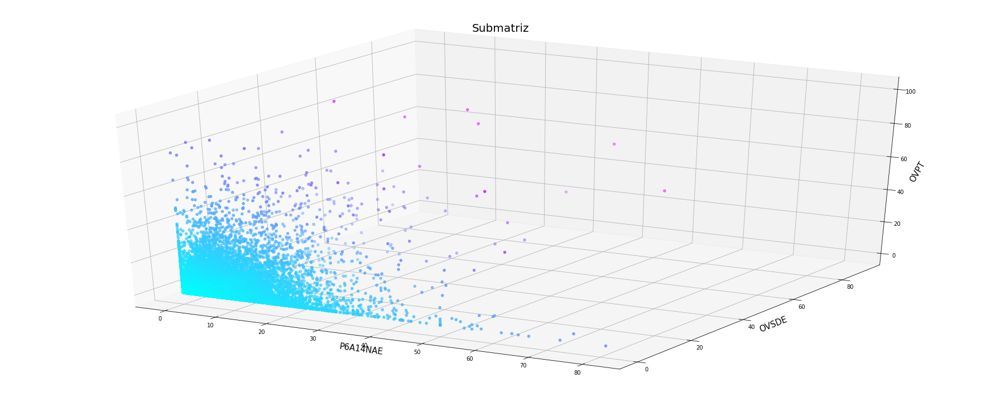

In [160]:
color_map = plt.get_cmap('cool')
plt.rcParams["figure.figsize"] = [25, 10]
plt.rcParams["figure.autolayout"] = True
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(df_features_1['P6A14NAE'], df_features_1['OVSDE'], df_features_1['OVPT'],c=(df_features_1['P6A14NAE']+ df_features_1["OVSDE"]+ df_features_1['OVPT']),cmap = color_map)
ax.set_title('Submatriz', fontsize=20)
ax.set_xlabel('P6A14NAE',fontsize=15,rotation=150)
ax.set_ylabel('OVSDE',fontsize=15,rotation=60)
ax.set_zlabel('OVPT',fontsize=15,rotation=60)
plt.show()

# 2.Ajuste simple por minimos cuadrados

2.1 Decide si las columnas POB_TOT (población total) y IM_2020  de df_INDICE definen una función o no. Justifica tu respuesta

In [29]:
graf3="Poblacion total vs Indice de Marginacion 2020"
fig = px.scatter(df_indice,x="POB_TOT", y="IM_2020", color_discrete_sequence=['blue'], marginal_x='histogram', marginal_y='histogram',opacity=0.7,title = graf3)
fig.show()



> Viendo la grafica podemos ver un patron que tal vez no puede dar un funcion que represente nuestros datos con cierto margen de error razonable. Pero si se necesita un estudio mas detallado.



2.2. Agrupa todas las AGEBS por población total y asigna la media del índice de marginación de cada grupo AGEB. Decide si la relación POB_TOT → IM_2020.mean es una función.

In [196]:
##Creamos una tabla auxiliar 
df_aux=df_indice[["AGEB","POB_TOT","IM_2020"]].sort_values("AGEB").reset_index()

print(df_aux)



       index  AGEB  POB_TOT     IM_2020
0      33867  0010      718  121.390988
1      21955  0010      798  124.224323
2      34580  0010     1195  119.968465
3      34238  0010     1075  116.176524
4       8988  0010     3183  122.711086
...      ...   ...      ...         ...
50785    667  9903      135  125.132341
50786    705  9918      384  119.721772
50787    707  9956      903  115.560084
50788    708  9960      735  115.874662
50789    709  9975     1301  116.231308

[50790 rows x 4 columns]




> Notemos que aunque los AGEB Sean iguales la poblacion tontal es diferente.



In [202]:
IM_2020_mean=[]
df_aux.index[df_aux["AGEB"]=="0010"].tolist()[-1]
ageb=list(df_aux["AGEB"])
ageb_set=[]

#Obtenemos una lista ordenada de AGEBS sin repetir
for element in ageb:
  if element not in ageb_set:
    ageb_set.append(element)

print(ageb_set)


  

['0010', '0011', '0012', '0013', '0014', '0015', '0016', '0017', '0018', '0019', '001A', '0020', '0021', '0022', '0023', '0024', '0025', '0026', '0027', '0028', '0029', '002A', '0030', '0031', '0032', '0033', '0034', '0035', '0036', '0037', '0038', '0039', '003A', '0040', '0041', '0042', '0043', '0044', '0045', '0046', '0047', '0048', '0049', '004A', '0050', '0051', '0052', '0053', '0054', '0055', '0056', '0057', '0058', '0059', '005A', '0060', '0061', '0062', '0063', '0064', '0065', '0066', '0067', '0068', '0069', '006A', '0070', '0071', '0072', '0073', '0074', '0075', '0076', '0077', '0078', '0079', '007A', '0080', '0081', '0082', '0083', '0084', '0085', '0086', '0087', '0088', '0089', '008A', '0090', '0091', '0092', '0093', '0094', '0095', '0096', '0097', '0098', '0099', '009A', '0100', '0101', '0102', '0103', '0104', '0105', '0106', '0107', '0108', '0109', '010A', '0110', '0111', '0112', '0113', '0114', '0115', '0116', '0117', '0118', '0119', '011A', '0120', '0121', '0122', '0123',



> Esta lista de todos los posibles valores nos ayudara a calcular los promedios y colocarlos en la posicion adecuada.






In [213]:
print("Valores distintos de AGEB:",len(ageb_set)) 
IM_2020_mean=[]

##Este pequeño for nos va ayudar a crear unan lista de los valores promedios
##que irian en la columna de los promedios de tal manera que a cada poblacion 

for element in ageb_set:
  lista=df_aux.index[df_aux["AGEB"]==element].tolist()
  promedio=df_aux["IM_2020"].iloc[lista].mean()
  for i in range(len(lista)):
    IM_2020_mean.append(promedio)

print(IM_2020_mean)



Valores distintos de AGEB: 7636
[118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 118.35808919354135, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 119.07952130197432, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 118.9549390264009, 11



> Ahora solo unimos la nueva columna


In [230]:

df=pd.DataFrame((IM_2020_mean))
df_art=pd.concat([df_aux,df],axis=1)
print(df_art)

       index  IM_2020_mean  AGEB  POB_TOT     IM_2020           0
0      33867    118.358089  0010      718  121.390988  118.358089
1      21955    118.358089  0010      798  124.224323  118.358089
2      34580    118.358089  0010     1195  119.968465  118.358089
3      34238    118.358089  0010     1075  116.176524  118.358089
4       8988    118.358089  0010     3183  122.711086  118.358089
...      ...           ...   ...      ...         ...         ...
50785    667    125.132341  9903      135  125.132341  125.132341
50786    705    119.721772  9918      384  119.721772  119.721772
50787    707    115.560084  9956      903  115.560084  115.560084
50788    708    115.874662  9960      735  115.874662  115.874662
50789    709    116.231308  9975     1301  116.231308  116.231308

[50790 rows x 6 columns]



> Ahora si podemos realiza el grafico




In [227]:
graf4="Poblacion total vs Promedios Indice de Marginacion 2020"
fig = px.scatter(df_art,x="POB_TOT", y="IM_2020_mean", color_discrete_sequence=['blue'], marginal_x='histogram', marginal_y='histogram',opacity=0.7,title = graf4)
fig.show()

2.3 Resuelve el problema de encontrar $\alpha$ y $\beta$ que mejor ajuste a la recta IM_2020.mean = $\alpha$ POB_TOT + $\beta$ utilizando el concepto de pseudo-inversa

In [238]:
x = df_art.iloc[:, -3].values.reshape(-1, 1) 
y = df_art.iloc[:, -5].values.reshape(-1, 1) 

linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(x, y)  # perform linear regression
IM_2020_promedio_pred = linear_regressor.predict(x)  # make predictions

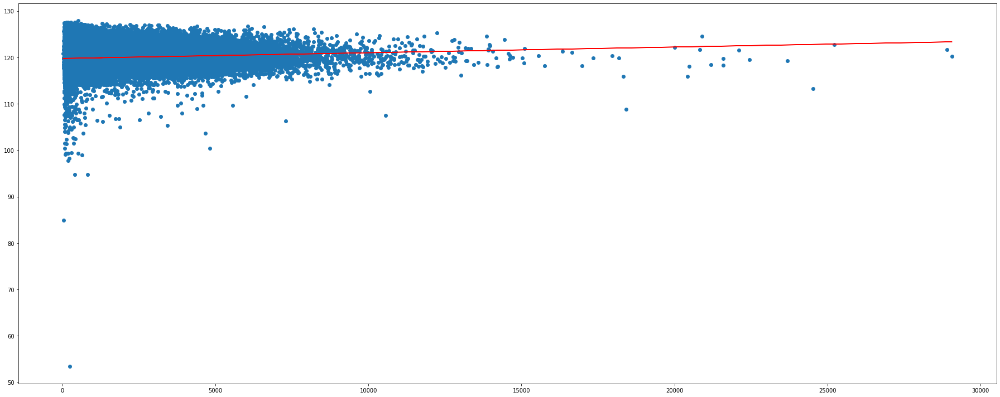

In [239]:
plt.scatter(x, y)
plt.plot(x, IM_2020_promedio_pred, color='red')
plt.show()

# 3. Relación lineal entre el índice de marginación urbana y los indicadores

3.1 Encuentra las relaciones lineales de IM_2020 con las columnas de df_FEATURES. Reporta cuidadosamente tus conclusiones. Establece las relaciones encontradas en fórmulas matemáticas específicas.

El objetivo es encontrar la relacion
**IM_2020 = $\alpha_1$(P6A14NAE) + $\alpha_2$(SBASC) + $\alpha_3$(PSDSS) + $\alpha_3$(OVSDE) + $\alpha_4$(OVSEE) + $\alpha_5$(OVSAE) + $\alpha_6$(OVPT) + $\alpha_7$(OVHAC) + $\alpha_8$(OVSREF) + $\alpha_9$(OVSINT) + $\alpha_10$(OSCEL) + $\beta$**

Calculamos

In [172]:
matriz_features = np.array(df_features) 
IM_2020_x = df_indice["IM_2020"].values
LR = linear_model.LinearRegression()
 
LR.fit(matriz_features, IM_2020_x)

print('Coefficients: \n', LR.coef_)
print('Interceptor: \n', LR.intercept_)


Coefficients: 
 [-0.18093874 -0.06602918 -0.07426677 -0.2829936  -0.33139186 -0.076051
 -0.0989917  -0.0302336  -0.0543476  -0.01280568 -0.07258523]
Interceptor: 
 128.01433686443085


En conclusion, la ecuación final tiene la siguiente forma:

$$IM_{2020} = -0.18093874(P6A14NAE)  -0.06602918(SBASC)  -0.07426677(PSDSS)  -0.2829936(OVSDE)  -0.33139186(OVSEE)  -0.076051(OVSAE)  -0.0989917(OVPT)  -0.0302336(OVHAC)  -0.0543476(OVSREF)  -0.01280568(OVSINT)  -0.07258523(OSCEL) + 128.0143.$$

Se tiene que todas las variables tiene una relación negativa con el Índice de marginación 2020. Lo cual es logico dado el contexto , por que a mayor valores de necesidades ,menor sera el indice.

# **4. Análsis de componentes principales**
4.1 Aplica el procedimiento de componentes principales a la matriz df_FEATURES usando la paquetería PCA de sklearn.decomposition y define un índice alternativo IM_2020_ALT definido como la primera componente. En términos lineales ¿qué tan distintos son IM_2020 e IM_2020_ALT?

Construimos el PCA con 1 componente.

In [162]:
scaler = StandardScaler()
features_std = scaler.fit_transform(df_features)

pca = PCA(n_components=1)
im_2020_alt = pca.fit_transform(features_std)
im_2020_alt = pd.DataFrame(im_2020_alt)
im_2020_alt

,0
0,0.530195
1,-2.949277
2,-2.678283
3,-2.095096
4,-3.050207
...,...
50785,2.989604
50786,0.319560
50787,0.171311
50788,0.070130


Continuando con los calculos, pero ahora aplicacion 11 al paramatro componentes.

In [163]:
pca = PCA(n_components=11)
pca.fit(matriz_features)
PCA(n_components=11)
print(pca.explained_variance_ratio_)

print(pca.singular_values_)


[0.65575087 0.08479898 0.06687761 0.05531128 0.04416553 0.04177558
 0.01695088 0.0141809  0.0128502  0.00432927 0.00300891]
[7270.97626634 2614.68037669 2322.00769772 2111.68986159 1886.96998568
 1835.20479131 1169.01319085 1069.24004791 1017.83680474  590.78684758
  492.52463195]


Creando un data frame que contenga tres variables: ENT, referente a Entidad; IM_2020, referente al indice de marginación 2020; e im_2020_alt, que es el índice de marginación 2020 obtenido. 

In [164]:
features_2 = ['NOM_ENT','IM_2020']
df_IM2020_alt_match = df_indice[features_2]
df_IM2020_alt_match.insert(loc=2,column='im_2020_alt',value= im_2020_alt[0] )
df_IM2020_alt_match = df_IM2020_alt_match.groupby(['NOM_ENT'], as_index = False).mean()
df_IM2020_alt_match

,NOM_ENT,IM_2020,im_2020_alt
0,Aguascalientes,122.744526,-1.224152
1,Baja California,121.109760,-0.748306
2,Baja California Sur,121.819653,-0.750074
3,Campeche,119.898810,0.367014
4,Chiapas,115.234129,2.331726
5,Chihuahua,121.870519,-0.779999
6,Ciudad de México,122.225778,-1.251578
7,Coahuila de Zaragoza,122.130486,-0.917751
8,Colima,121.941324,-0.809733
9,Durango,120.962324,-0.342749


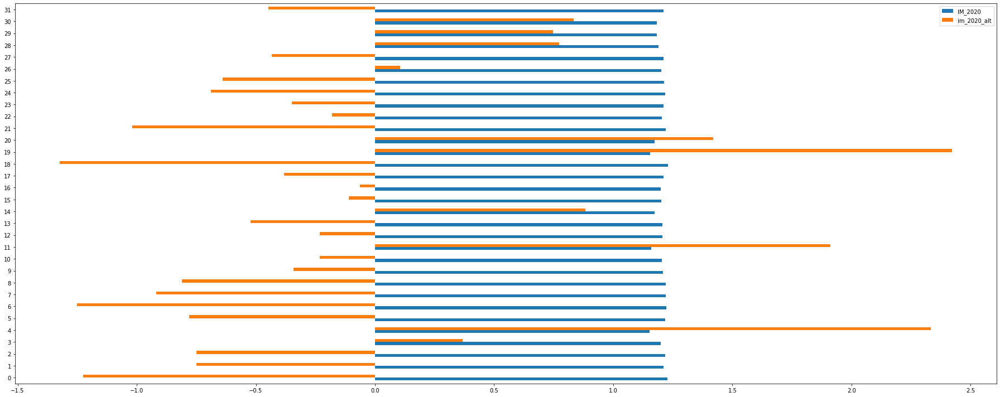

In [165]:
df_IM2020_alt_match['IM_2020']=df_IM2020_alt_match['IM_2020']/100
ax = df_IM2020_alt_match.plot.barh()
index = df_IM2020_alt_match['NOM_ENT']

4.1. Estudia las relaciones lineales del IM_2020 con todas las componentes. 

Se puede resolverse aplicando la Pseudoinversa de M-P. Además, dado que la matriz df_features es de dimensión 50790 × 11,ademas de rango 11
 entonces $A^+ = A_{left}^{-1} : R^{n} \rightarrow R$ y se alcanza el mínimo del problema $\min_{x} = \Vert Ax - b\Vert^{2}$ en un único punto en $R^m:$

**$x^+ = A^+\space b = (A^{T}A)^{-1}A^{T}b$**

Entonces en nuestro caso tenemos

$x^+ = df_{FEATURES}^+\space IM_{2020} = (df_{FEATURES}^{T}\space df_{FEATURES})^{-1}df_{FEATURES}^{T} \space IM_{2020}$

Para resolver la ecuación primero calculamos la transpuesta de la matriz de interés y obtenemos el producto de esta por la matriz original. 

In [166]:
matriz_features.transpose()
matriz_features_2 = np.matmul(matriz_features.transpose(), matriz_features)
matriz_features_2

array([[2.85539669e+06, 9.28530946e+06, 7.77786991e+06, 2.69887530e+05,
        1.82666603e+05, 1.08042820e+06, 1.18833217e+06, 8.17053916e+06,
        3.09954813e+06, 1.39338913e+07, 2.49117073e+06],
       [9.28530946e+06, 5.11897524e+07, 3.89054784e+07, 1.73449046e+06,
        9.96532215e+05, 6.19528849e+06, 6.74842183e+06, 4.40349825e+07,
        1.80770249e+07, 7.68783412e+07, 1.38909203e+07],
       [7.77786991e+06, 3.89054784e+07, 3.98265579e+07, 9.48870903e+05,
        6.40836504e+05, 4.58538969e+06, 4.69278897e+06, 3.55159067e+07,
        1.30651458e+07, 6.00098771e+07, 1.02447572e+07],
       [2.69887530e+05, 1.73449046e+06, 9.48870903e+05, 4.59050999e+05,
        8.98117448e+04, 4.21631569e+05, 4.20729299e+05, 1.69652176e+06,
        9.94145359e+05, 2.77451014e+06, 5.96435878e+05],
       [1.82666603e+05, 9.96532215e+05, 6.40836504e+05, 8.98117448e+04,
        3.15722857e+05, 4.19409597e+05, 3.45777792e+05, 9.69895530e+05,
        7.35838631e+05, 1.65722544e+06, 3.22535916e+

A continuacion se calculaa la inversa de matriz_features_2. Se nombrará como matriz_features_3.



In [167]:
matriz_features_3 =  np.linalg.inv(matriz_features_2)
matriz_features_3

array([[ 9.00313448e-07, -1.20896324e-07, -5.82515320e-08,
         3.69994370e-08, -7.69726409e-08,  6.56840696e-09,
        -1.27262247e-08, -2.29345751e-08,  3.94147993e-08,
         9.72157369e-09, -2.13787282e-08],
       [-1.20896324e-07,  2.80568319e-07, -4.56283175e-08,
        -4.42436597e-08,  9.99156276e-09,  4.73413530e-09,
        -2.76116369e-08, -6.14138211e-08,  1.31841270e-08,
        -8.20985300e-08, -1.05324700e-07],
       [-5.82515320e-08, -4.56283175e-08,  1.16859475e-07,
         9.74091154e-08,  1.03142362e-08, -2.91419077e-09,
         2.46689201e-08, -4.32238717e-08,  1.68200772e-08,
        -5.49787001e-09,  1.75862516e-09],
       [ 3.69994370e-08, -4.42436597e-08,  9.74091154e-08,
         2.86604554e-06, -1.82525111e-07, -4.75088904e-08,
        -1.16217118e-07, -7.77819164e-08, -1.20215187e-07,
         1.01964009e-08, -5.50521241e-08],
       [-7.69726409e-08,  9.99156276e-09,  1.03142362e-08,
        -1.82525111e-07,  4.02952468e-06, -1.34297675e-07,
  



> Multiplicamos por la transpuesta




In [169]:
matriz_features_4 = np.matmul(matriz_features_3, matriz_features.transpose())
matriz_features_4

array([[ 8.43786846e-06, -1.16995289e-06,  1.68434325e-06, ...,
         2.29963136e-07, -9.98634082e-07, -4.53465395e-06],
       [-4.00351972e-06, -1.21375863e-08, -1.83305163e-06, ...,
         3.79541767e-06, -4.27440419e-06,  2.47414670e-06],
       [-8.96582914e-07,  2.07794451e-06,  8.73886348e-07, ...,
        -1.61201061e-06, -1.13944839e-06, -2.25895319e-06],
       ...,
       [ 3.74676121e-06,  1.76829818e-07, -3.41299564e-07, ...,
         1.82673368e-07, -1.57824594e-07, -7.46780168e-07],
       [ 2.73473580e-06, -3.94864143e-07,  1.00025679e-06, ...,
         7.43162022e-07,  3.05940776e-06,  2.75104246e-06],
       [-3.98202141e-06, -1.58329707e-07, -9.54158349e-08, ...,
         5.41736623e-07, -2.70432726e-06, -2.85111290e-06]])



> Y para terminar multiplicamos este ultimo por el vector, obteniendo x



In [170]:
x = np.matmul(matriz_features_4, df_indice['IM_2020'])
x

array([ 1.52552093,  0.20761029,  2.10285606, -0.59841763,  0.88961968,
       -0.41067825, -1.30031258,  0.94598087, -1.51120149,  0.60319753,
        0.81715055])

El arreglo $x$ representa las $11$ compontnes que satisfacen la ecuación 

$$IM_{2020}= x_1 (P6A14NAE)+ x_2 (SBASC) +\ldots + x_{11} (OSCEL)$$ 

Usando las componentes del arreglo $x$, esta ecuación se reescribe como

$$IM_{2020}= 1.52552093 (P6A14NAE)+ 0.20761029 (SBASC) +\ldots + 0.81715055 (OSCEL)$$,

donde se muestran las relaciones lineales del IM_2020.